# Dataset Description

# CS (Color Score): <br/>
Represents the color score of the honey sample, ranging from 1.0 to 10.0. Lower values indicate a lighter color, while higher values indicate a darker color.

# Density: <br/>
Represents the density of the honey sample in grams per cubic centimeter at 25°C, ranging from 1.21 to 1.86.

# WC (Water Content): <br/>
Represents the water content in the honey sample, ranging from 12.0% to 25.0%.

# pH: <br/>
Represents the pH level of the honey sample, ranging from 2.50 to 7.50.

# EC (Electrical Conductivity): <br/>
Represents the electrical conductivity of the honey sample in milliSiemens per centimeter.

# F (Fructose Level): <br/>
Represents the fructose level of the honey sample, ranging from 20 to 50.

# G (Glucose Level): <br/>
Represents the glucose level of the honey sample, ranging from 20 to 45.

# Pollen_analysis: <br/>
Represents the floral source of the honey sample. Possible values include Clover, Wildflower, Orange Blossom, Alfalfa, Acacia, Lavender, Eucalyptus, Buckwheat, Manuka, Sage, Sunflower, Borage, Rosemary, Thyme, Heather, Tupelo, Blueberry, Chestnut, and Avocado.

# Viscosity: <br/>
Represents the viscosity of the honey sample in centipoise, ranging from 1500 to 10000. Viscosity values between 2500 and 9500 are considered optimal for purity.

# Purity: <br/>
The target variable represents the purity of the honey sample, ranging from 0.01 to 1.00.

# Price: <br/>
The calculated price of the honey.

# 1.Importing Required Libraries


> This code imports essential libraries for data analysis and visualization: `pandas` for data manipulation, `numpy` for numerical operations, `matplotlib.pyplot` and `seaborn` for plotting, and suppresses warning messages using `warnings.filterwarnings('ignore')`.



In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

# 2.Loading the data Set

In [ ]:
df = pd.read_csv('/content/honey_purity_dataset.csv')

In [ ]:
df.head(10)

,CS,Density,WC,pH,EC,F,G,Pollen_analysis,Viscosity,Purity,Price
0,2.81,1.75,23.04,6.29,0.76,39.02,33.63,Blueberry,4844.50,0.68,645.24
1,9.47,1.82,17.50,7.20,0.71,38.15,34.41,Alfalfa,6689.02,0.89,385.85
2,4.61,1.84,23.72,7.31,0.80,27.47,34.36,Chestnut,6883.60,0.66,639.64
3,1.77,1.40,16.61,4.01,0.78,31.52,28.15,Blueberry,7167.56,1.00,946.46
4,6.11,1.25,19.63,4.82,0.90,29.65,42.52,Alfalfa,5125.44,1.00,432.62
5,2.17,1.35,20.67,4.11,0.75,27.19,43.54,Borage,3967.30,0.80,593.55
6,7.15,1.57,13.37,5.79,0.89,43.38,44.94,Sunflower,7384.93,0.95,838.98
7,3.17,1.23,23.35,6.64,0.85,43.50,36.33,Chestnut,5598.87,0.66,639.64
8,4.98,1.73,16.60,6.61,0.74,22.49,44.74,Orange Blossom,8800.10,0.95,238.05
9,8.49,1.50,15.75,4.50,0.86,49.59,38.13,Blueberry,2675.60,0.82,777.84


# 3.Initial Data Understanding


*   shape
*   info
*   describe
*   null values handling
*   duplicate values








In [ ]:
df.shape

(32050, 11)

In [ ]:
df.isnull().sum()

CS                 0
Density            0
WC                 0
pH                 0
EC                 0
F                  0
G                  0
Pollen_analysis    0
Viscosity          0
Purity             0
Price              1
dtype: int64

In [ ]:
df.dropna(inplace=True)

In [ ]:
df.isnull().sum()

CS                 0
Density            0
WC                 0
pH                 0
EC                 0
F                  0
G                  0
Pollen_analysis    0
Viscosity          0
Purity             0
Price              0
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.describe()

,CS,Density,WC,pH,EC,F,G,Viscosity,Purity,Price
count,32049.000000,32049.000000,32049.000000,32049.000000,32049.000000,32049.000000,32049.000000,32049.000000,32049.000000,32049.000000
mean,5.499007,1.535517,18.535131,4.998913,0.799486,34.991969,32.561412,5760.129392,0.824993,594.437508
std,2.590950,0.187386,3.737824,1.447085,0.057809,8.652023,7.185156,2451.283780,0.139447,234.199340
min,1.000000,1.210000,12.000000,2.500000,0.700000,20.000000,20.000000,1500.060000,0.610000,128.720000
25%,3.260000,1.370000,15.300000,3.730000,0.750000,27.530000,26.330000,3635.790000,0.660000,432.620000
50%,5.490000,1.540000,18.530000,5.000000,0.800000,34.970000,32.620000,5779.990000,0.820000,612.960000
75%,7.740000,1.700000,21.780000,6.250000,0.850000,42.490000,38.720000,7870.810000,0.970000,771.330000
max,10.000000,1.860000,25.000000,7.500000,0.900000,50.000000,45.000000,9999.850000,1.000000,976.690000


# 4. Feature Encoding

> This code snippet uses `LabelEncoder` from `sklearn.preprocessing` to convert the categorical column `Pollen_analysis` in the dataframe `df` into numeric labels. The `fit_transform` method encodes the categorical values, replacing them with corresponding integers.

In [ ]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Pollen_analysis'] = le.fit_transform(df['Pollen_analysis'])

# 4. Exploratory Data Analysis





> This code creates a heatmap to visualize the correlation matrix of the dataset `df`, with annotations showing correlation values. The heatmap uses a 'coolwarm' color scheme, displays values formatted to two decimal places, and includes black lines separating the cells. The plot is displayed using `plt.show()`.



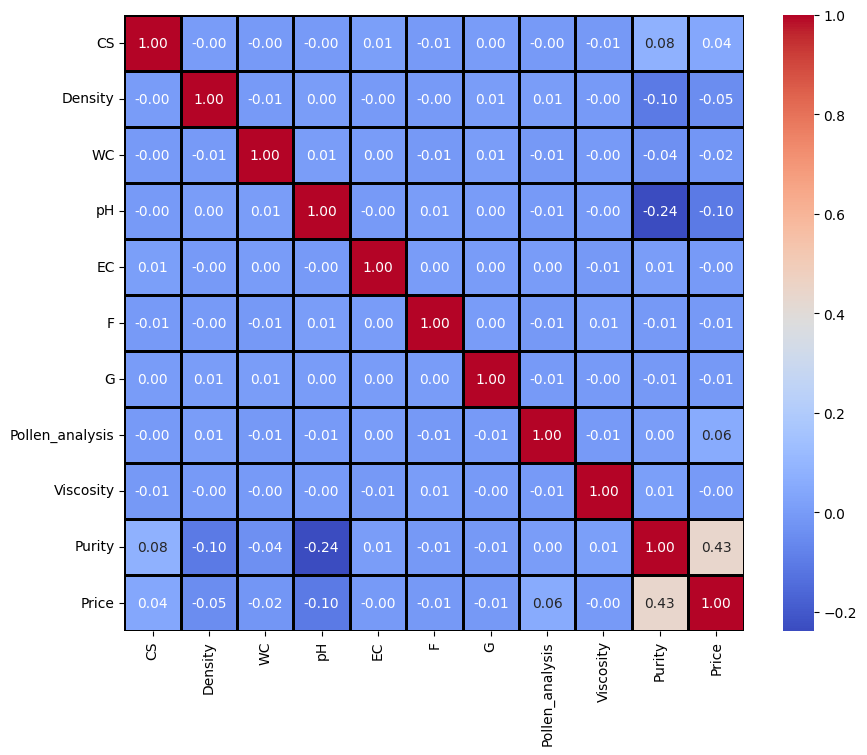

In [ ]:
plt.figure(figsize=(10,8))
sns.heatmap(df.corr(),annot=True,cmap='coolwarm',fmt='.2f',linewidths=1,linecolor='black')
plt.show()

> This code snippet creates a scatter plot using Seaborn to visualize the relationship between the `pH` level (x-axis) and `Purity` (y-axis) of honey samples in the dataframe `df`. The plot is displayed with a figure size of 10 by 8 inches using `plt.show()`.

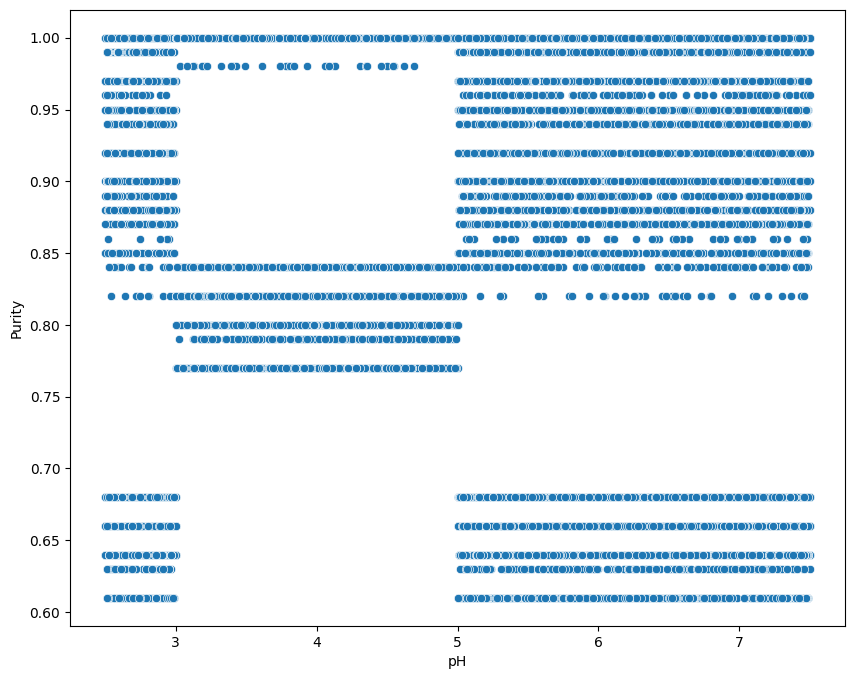

In [ ]:
plt.figure(figsize=(10,8))
sns.scatterplot(x='pH',y='Purity',data=df)
plt.show()

>  This code creates a scatter plot using Seaborn to visualize the relationship between `Density` (x-axis) and `Purity` (y-axis) of honey samples in the dataframe `df`, with different colors representing different values of `Pollen_analysis`. The plot is displayed using `plt.show()`.

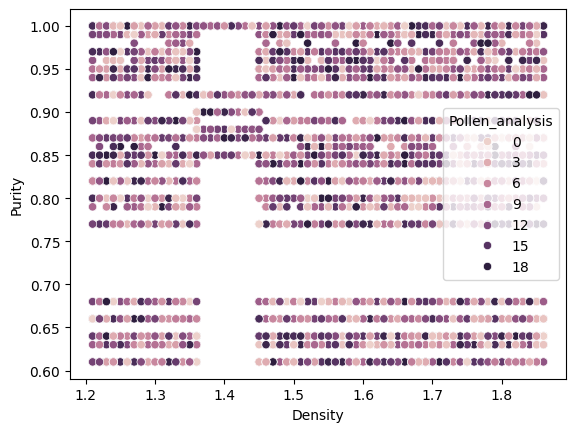

In [ ]:
sns.scatterplot(x='Density',y='Purity',data=df,hue='Pollen_analysis')
plt.show()

>  This code creates a bar plot using Seaborn to display the average `pH` levels (y-axis) for each category in `Pollen_analysis` (x-axis) from the dataframe `df`. The plot is set to a figure size of 10 by 8 inches and displayed using `plt.show()`.

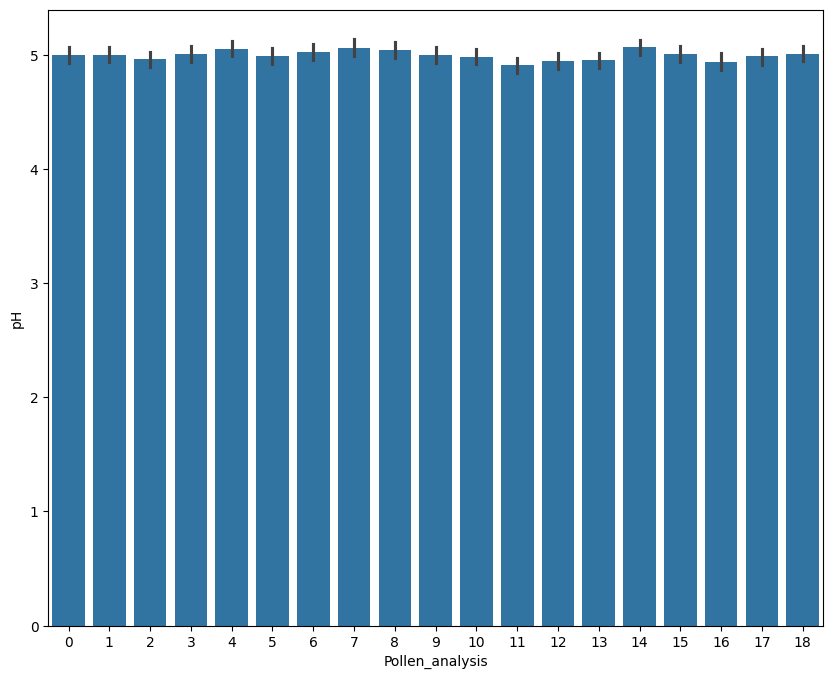

In [ ]:
plt.figure(figsize=(10,8))
sns.barplot(x='Pollen_analysis',y='pH',data=df)
plt.show()

> This code snippet creates a scatter plot using Seaborn to visualize the relationship between `Purity` (x-axis) and `Price` (y-axis) of honey samples in the dataframe `df`, with the points colored red. The plot is displayed using `plt.show()`.

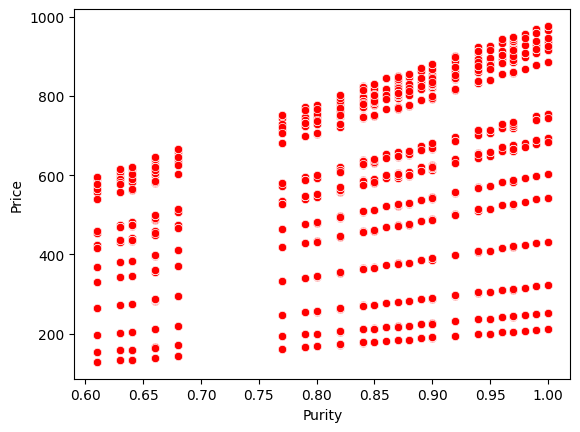

In [ ]:
sns.scatterplot(x='Purity',y='Price',data=df,color='red')
plt.show()

> This code snippet creates a scatter plot using Seaborn to visualize the relationship between `pH` (x-axis) and `Price` (y-axis) of honey samples in the dataframe `df`, with the points colored green. The plot is displayed using `plt.show()`.

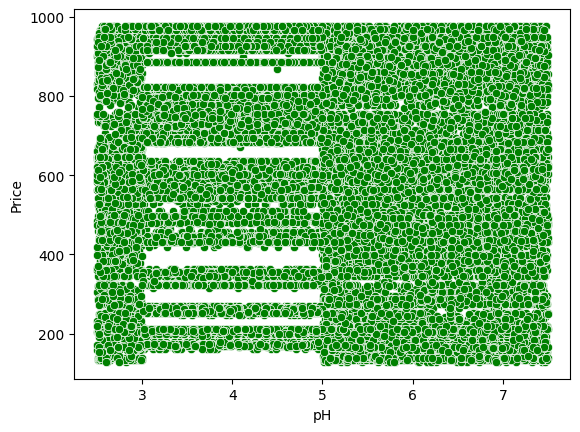

In [ ]:
sns.scatterplot(x='pH',y='Price',data=df,color='green')
plt.show()

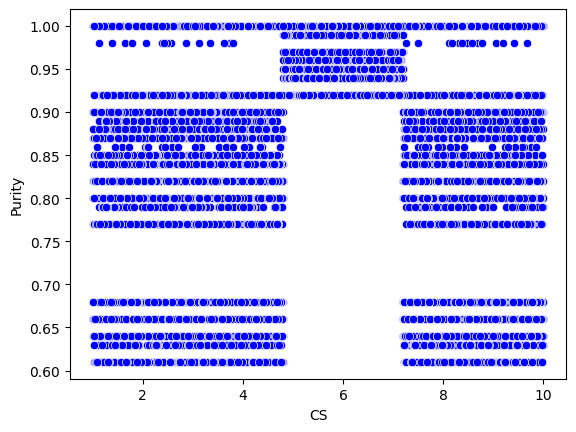

In [ ]:
sns.scatterplot(x='CS',y='Purity',data=df,color='blue')
plt.show()

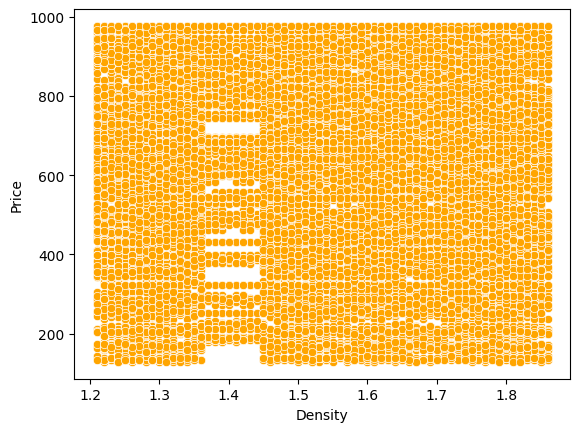

In [ ]:
sns.scatterplot(x='Density',y='Price',data=df,color='orange')
plt.show()

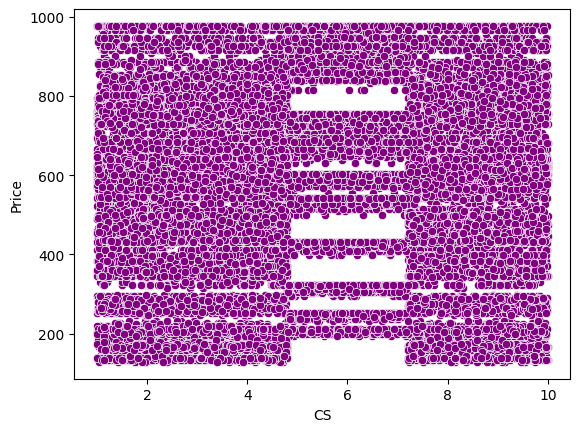

In [ ]:
sns.scatterplot(x='CS',y='Price',data=df,color='purple')
plt.show()

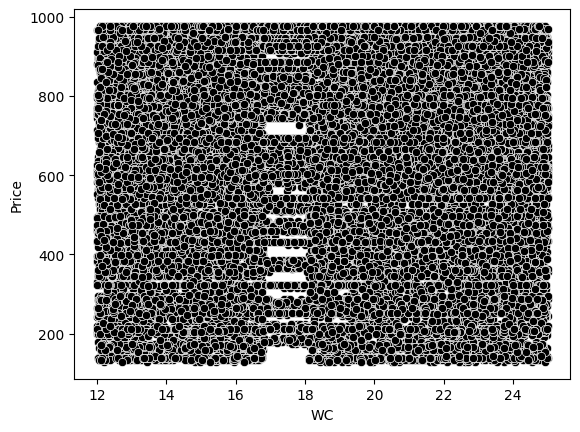

In [ ]:
sns.scatterplot(x='WC',y='Price',data=df,color='black')
plt.show()

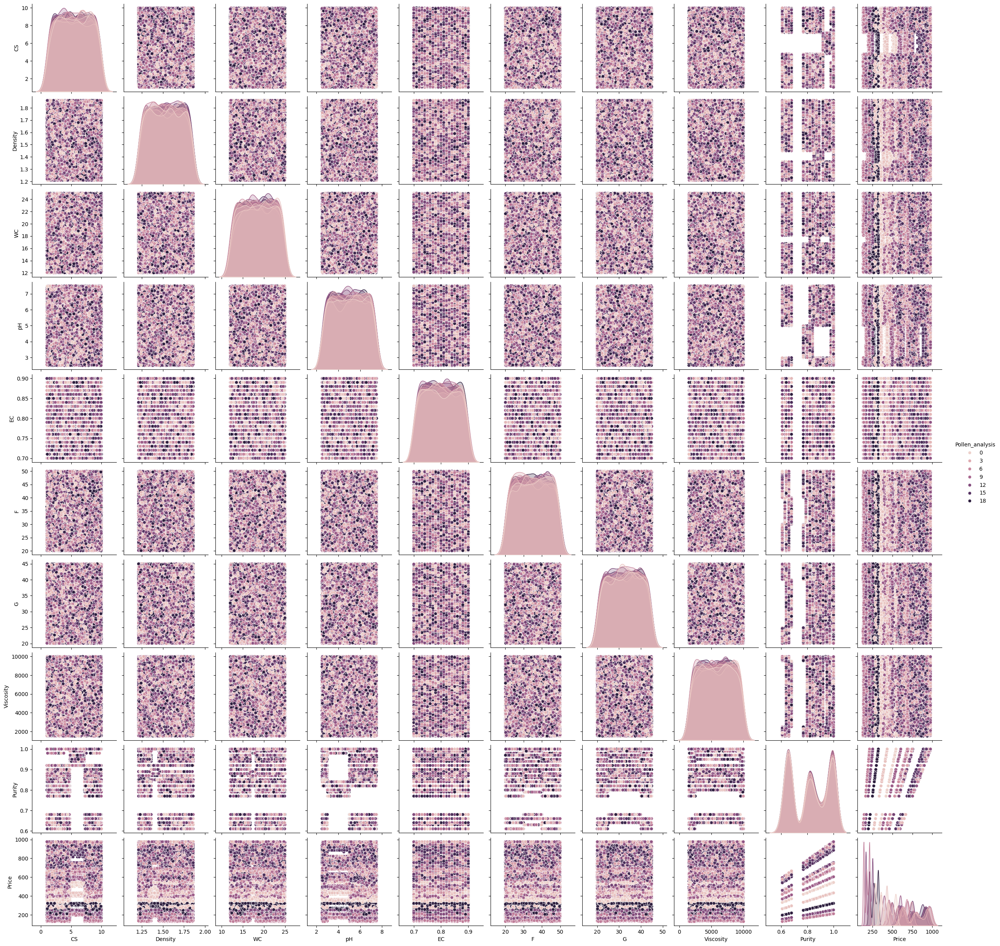

In [ ]:
sns.pairplot(df,hue='Pollen_analysis')
plt.show()

# 5. Analysis of Numerical Variables

In [40]:
df['CS'].mean()

5.499007457330962

In [37]:
df['CS'].value_counts()

CS
2.77     54
5.01     54
1.39     53
4.96     53
8.25     52
         ..
7.40     19
9.13     19
1.00     19
3.31     19
10.00    17
Name: count, Length: 901, dtype: int64

In [38]:
df['CS'].max()

10.0

**On researching, The density of honey typically ranges between 1.38 and 1.45 kg/L at 20 °C. (While its not confirmed about the temperature) The average Density almost matches the actual value.**

In [39]:
df['Density'].mean()

1.5355165527785577

In [41]:
df.groupby('Pollen_analysis')['Density'].mean()

Pollen_analysis
0     1.531557
1     1.537323
2     1.542529
3     1.527492
4     1.530581
5     1.537865
6     1.524742
7     1.535329
8     1.534098
9     1.534559
10    1.542240
11    1.535571
12    1.534816
13    1.539895
14    1.542641
15    1.531250
16    1.537297
17    1.538564
18    1.536385
Name: Density, dtype: float64

**On researching, The Average pH value of a honey ==3.9. While here it is 4.9**

In [42]:
df['pH'].mean()

4.998912602577303

**The average Fructose level wikipedia reports is 40.9g , while here it is almost 35g .**

In [43]:
df['F'].mean()

34.991969484227276

**The average Glucose level wikipedia reports is 35.8g, while here it is almost matches, 32.5g**

In [44]:
df['G'].mean()

32.56141190052732

**Values of electrical conductivity in the investigated honey samples were between 0.08 and 1.99 ms/cm.** <br/>
**the value here is 0.799 ms/cm**

In [46]:
df['EC'].mean()

0.799486099410278

**However, the optimal viscosity for honey is often considered to be between 2500 and 9500 cP, as it indicates good quality and purity.** <br/>

**Here the average viscosity is 5760.1 cP**











In [47]:
df['Viscosity'].mean()

5760.129391556679

In [35]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 32049 entries, 0 to 32048
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   CS               32049 non-null  float64
 1   Density          32049 non-null  float64
 2   WC               32049 non-null  float64
 3   pH               32049 non-null  float64
 4   EC               32049 non-null  float64
 5   F                32049 non-null  float64
 6   G                32049 non-null  float64
 7   Pollen_analysis  32049 non-null  int64  
 8   Viscosity        32049 non-null  float64
 9   Purity           32049 non-null  float64
 10  Price            32049 non-null  float64
dtypes: float64(10), int64(1)
memory usage: 2.9 MB


# 6. Feature Splitting

> This code assigns `X` as a dataframe containing all columns from `df` except `Price`, effectively dropping the `Price` column. `y` is assigned the `Price` column, which serves as the target variable for prediction or analysis tasks.

In [28]:
X = df.drop(['Price'],axis=1)
y = df['Price']

#7. Train_Test_Split

> This code snippet uses `train_test_split` from `sklearn.model_selection` to split the dataset into training and testing sets. `X_train` and `X_test` contain the feature variables (excluding `Price`), while `y_train` and `y_test` contain the corresponding target variable (`Price`). The `test_size` parameter is set to 0.2, indicating an 80-20 split for training and testing data, and `random_state` is set to 42 for reproducibility in the split.

In [29]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=42)

In [30]:
X_train.shape

(25639, 10)

In [31]:
y_train.shape

(25639,)

# 8. Model Building

> DecisionTreeRegressor

> This code initializes a Decision Tree Regressor model from `sklearn.tree` and fits it to the training data (`X_train` and `y_train`). The model is now trained and ready to make predictions on new data.

In [32]:
from sklearn.tree import DecisionTreeRegressor
dt = DecisionTreeRegressor()
dt.fit(X_train,y_train)

DecisionTreeRegressor()

# 9. Model Prediction

> Using the trained Decision Tree Regressor ('dt'), y_pred predicts the 'Price' values for the test dataset ('X_test')

In [33]:
y_pred = dt.predict(X_test)

# 10. Model Efficiency and Evaluation

> This code calculates and prints evaluation metrics for the regression model predictions:

> - **R2 Score**: Measures the proportion of variance in the dependent variable (`Price`) that is predictable from the independent variables.
> - **Mean Absolute Error (MAE)**: Average of the absolute differences between predicted and actual values.
> - **Mean Squared Error (MSE)**: Average of the squared differences between predicted and actual values.

> These metrics help assess how well the model performs in predicting the `Price` of honey based on the features in the test dataset (`X_test` and `y_test`).

In [34]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
print('R2 Score:',r2_score(y_test,y_pred))
print('Mean Absolute Error:',mean_absolute_error(y_test,y_pred))
print('Mean Squared Error:',mean_squared_error(y_test,y_pred))

R2 Score: 0.9999928847793266
Mean Absolute Error: 0.06848049922076378
Mean Squared Error: 0.3887007800312096


# 11. Model Evaluation and Visualization


> This code will produce a scatter plot where each point represents a sample from the test set. The x-axis shows the actual `Price` values (`y_test`), and the y-axis shows the predicted `Price` values (`y_pred`). The line represents the regression line fitted to the data points, giving an indication of how well the predictions align with the actual values.

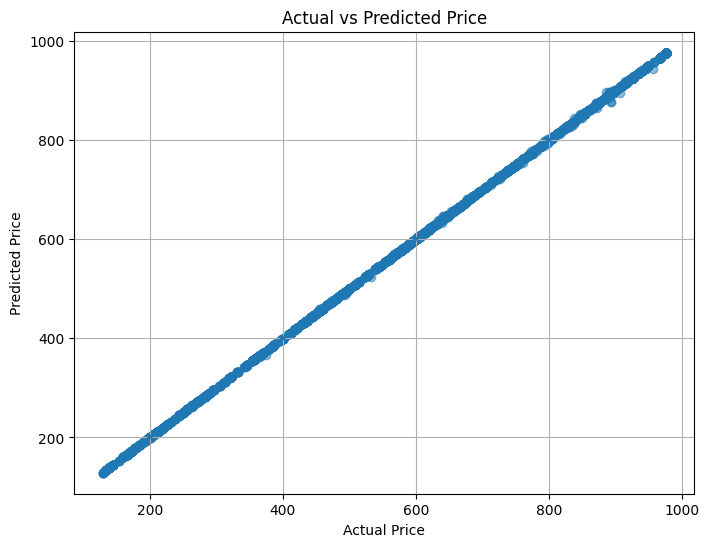

In [48]:
# Plotting actual vs predicted values
plt.figure(figsize=(8, 6))
sns.regplot(x=y_test, y=y_pred, scatter_kws={'alpha':0.5})
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.title('Actual vs Predicted Price')
plt.grid(True)
plt.show()

# 12. Pickling the file

In [49]:
import pickle
pickle.dump(dt,open('model.pkl','wb'))